# Downlink Angle of Departure based Positioning for Rural Macro Terrain in 5G and Beyond Network
Downlink Angle of Departure (AoD) based positioning in 5G networks is a technique used to determine the location of user equipment (UE) by analyzing the angles from which downlink signals are transmitted from the base station (gNodeB) to the UE. This method leverages the gNodeB's ability to estimate the angles of departure of downlink signals from multiple transmit antennas, enabling the calculation of the UE's position relative to the gNodeB. 
The detailed explanations of Downlink Angle of Departure (AoD) based positioning in 5G networks:

- **Signal Transmission and Reception**: In Downlink AoD based positioning, the base station (gNodeB) transmits downlink signals to the user equipment (UE) using multiple transmit antennas. Each transmit antenna emits signals with different angles of departure, covering a range of spatial directions to reach the UE.

- **Angle Estimation Techniques**: The UE measures the angles of departure of the downlink signals it receives from the gNodeB. This is typically achieved using signal processing techniques that analyze the phase and amplitude differences of the received signals across the UE's antenna array. Techniques such as beamforming, spatial filtering, or maximum likelihood estimation may be employed to estimate the angles of departure accurately.

- **Angle of Departure Calculation**: Based on the measured angles of departure from multiple antennas at the UE, the UE calculates its position relative to the gNodeB. Triangulation or multilateration techniques are commonly used for position calculation. These techniques involve using the known locations of the gNodeB antennas and the measured angles of departure to compute the UE's position.

- **Antenna Configuration and Spatial Resolution**: The accuracy of Downlink AoD based positioning depends on the configuration and spacing of antennas at both the gNodeB and the UE. A larger number of antennas and wider antenna spacing result in higher angular resolution, allowing for more precise angle estimation and positioning.

- **Positioning Accuracy and Challenges**: The accuracy of Downlink AoD based positioning depends on factors such as the quality of the received signals, the presence of multipath propagation, and environmental conditions. Challenges such as signal distortion, noise, and interference can affect the accuracy of angle estimation and positioning, requiring advanced signal processing techniques and robust algorithms to mitigate these effects.

- **Applications and Benefits**: Downlink AoD based positioning has various applications in 5G networks, including location-based services, asset tracking, indoor navigation, and emergency response. By accurately determining the positions of UEs, Downlink AoD based positioning enables the delivery of location-aware services, enhances network management capabilities, and improves overall user experience

The details of the tutorial simulation parameters is shown below:

|Parameters|Values|
| :- | -:  |
| Positioning Method  | ToA based  |
| Parameter Estimation Method  | ESPRIT  |
| Optimization Method | Least Squrare |
| Bandwidth | 30 MHz |
| Subcarrier Spacing | 30 kHz|
| Terrain | Urban Macro-LoS |
|Channel State Information |Zero Forcing + Spline Interpolation|
| Reference Signal | Positioning Reference Signal (PRS) |
|Simulation Type| System Level Simulation|
| Channel Normalization | Disabled |

The tutorial will generate 5G standards compliant reference signal (PRS) which is transmitted by BS foe UE to perform measurement which inturn can be used to estimate the location of the UE. Users can generate the Wireless channel either using our tool which has one of the most exhaustive channel modelling library or use some other $3^{rd}$ party tool such as Sionna, Quadriga to generate the channel and use it with 5G Toolkit. 

### Positioning Procedure

- Generate the Reference Signal
- Transmit the Reference Signal
- Pass the Transmit Signal through Wireless Channel
- Add Noise at the Receiver
- Estimate the Channel at Pilot Locations
- Interpolate the channel at remaining locations
- Estimate the Delays (Time of arrival using the channel Estimates)
- Estimate the Position using ToA estimates.


Finally, we will demonstrate the efficacy of these methods using simulation evaluation results: 

- Horizontal (2D) Positioning Accuracy vs SNR
- Verical Positioning Accuracy vs SNR
- 3D Positioning Accuracy

    
### Table of Content:

* [Import Libraries](#Import-Libraries)
    - [Python Libraries](#Python-Libraries)
    - [5G Toolkit Libraries](#5G-Toolkit-Libraries)
* [Simulation Parameters](#Simulation-Parameters)
* [Channel Generation](#Channel-Generation)
* [Positioning Reference Signal](#Position-Reference-Signal)
* [OFDM Transmitter: Create Transmission Grid](#OFDM-Transmitter:-Create-Transmission-Grid)
    - [Display Transmission Grid](#Display-Transmission-Grid)
* [Transmit Beamforming](#Transmit-Beamforming)
* [Pass the Beamformed Grid Through Wireless Channel](#Pass-the-Beamformed-Grid-Through-Wireless-Channel)
* [Add Noise](#Add-Noise)
    * [Display Received Resource Grid](#Display-Received-Resource-Grid)
* [Extracting the Resource Grid](#Extracting-the-Resource-Grid)
* [Channel Estimation + Channel Interpolation](#Channel-Estimation-+-Interpolation)
    - [Display the quality of Channel Estimates](#Display-the-quality-of-Channel-Estimates)
* [ToA Estimation](#ToA-Estimation)
    - [Visualization: Time of Arrival locus Circles](#Visualization:-Time-of-Arrival-locus-Circles)
* [Position Estimation + K-Best Measurement Selection (Genie Aided)](#Position-Estimation-+-K-Best-Measurement-Selection-(Genie-Aided))
    - [Measurement-Selection](#Measurement-Selection:)
    - [Visualization of Positioning]()
* [Performance Analysis of Positioning Error for ToA based method](#Performance-Analysis-of-Positioning-Error-for-ToA-based-method)
* [Further Study](#Further-Study)


## Import Libraries
### Python Libraries

In [1]:
# from IPython.display import display, HTML
# display(HTML("<style>.container { width:90% !important; }</style>"))

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

# %matplotlib widget
import matplotlib.pyplot  as plt
import matplotlib.patches as mpatches
import matplotlib as mpl

import numpy      as np
import numpy.matlib
import scipy      as sp
import scipy.io   as spio
import scipy.constants
from   scipy import interpolate
from scipy.interpolate import NearestNDInterpolator, make_interp_spline, CubicSpline, PchipInterpolator, Akima1DInterpolator

### 5G Toolkit Libraries

In [2]:
import sys
sys.path.append("../../../")

from toolkit5G.ChannelModels     import AntennaArrays, SimulationLayout, ParameterGenerator, ChannelGenerator
from toolkit5G.ResourceMapping   import ResourceMapperPRS
from toolkit5G.Positioning       import ToAEstimation, Position_Estimation, LeastSquareDoA
from toolkit5G.ChannelProcessing import AddNoise

## Simulation Parameters

|Parameters|Values|
| :- | -:  |
| **Terrain**  | Rural Macro (RMa)  |
| **Carrier Frequency**  | 3.6 GHz |
| **Subcarrier Spacing** | 30 kHz |
| **Number of Base-station** | 21 (7 sites with 3 sectors each) |
| **BS Deployment** | Hexagonal|
|**UE Dropping**| Eqaul number of UEs are dropped uniformly at random in each Hexagonal|
| **Number of UEs** | 400|
| **Bandwidth** | 30 MHz (85 RBs) |
| **Number of RBs** | 85|

In [3]:
# propTerrain      = "CDL-D"   # Propagation Scenario or Terrain for BS-UE links
propTerrain      = "RMa"       # Propagation Scenario or Terrain for BS-UE links
carrierFrequency = 3.6*10**9   # Array of two carrier frequencies in GHz
scs              = 30*10**3
Nfft             = 1024
nBSs             = 21          # number of BSs 
nUEs             = 100         # number of UEs
Bandwidth        = 30*10**6
numRBs           = 85

print()
print("*****************************************************")
print("                   Terrain: "+str(propTerrain))
print("             Number of UEs: "+str(nUEs))
print("             Number of BSs: "+str(nBSs))
print("         carrier Frequency: "+str(carrierFrequency/10**9)+" GHz")
print("                 Bandwidth: "+str(Bandwidth))
print(" Number of Resource Blocks: "+str(numRBs))
print("        Subcarrier Spacing: "+str(scs))
print("                  FFT Size: "+str(Nfft))
print("*****************************************************")
print()


*****************************************************
                   Terrain: RMa
             Number of UEs: 100
             Number of BSs: 21
         carrier Frequency: 3.6 GHz
                 Bandwidth: 30000000
 Number of Resource Blocks: 85
        Subcarrier Spacing: 30000
                  FFT Size: 1024
*****************************************************



## Channel Generation
### Channel Parameters:

1. Intersite Distance: 100m
2. BS is deployed at 35m and UE has a random height between 0 and 1.5m.
2. BS Antennas Arrays:
    - Antenna Types: Parabolic
    - Number of Panels: 1
    - Number of Antennas: 2 Horizontally, 2 Verically
    - Polarization: 1 (Monopole)
2. UE Antennas Arrays:
    - Antenna Types: Hertizian (Omni)
    - Number of Panels: 1
    - Number of Antennas: 4 Horizontally, 4 Verically
    - Polarization: 1 (Monopole)
3. Mobility: No Mobility
4. OFDM Channel: 
    - Carrier Phase: Disabled.
    - $\text{N}_\text{fft}$: 1024
    

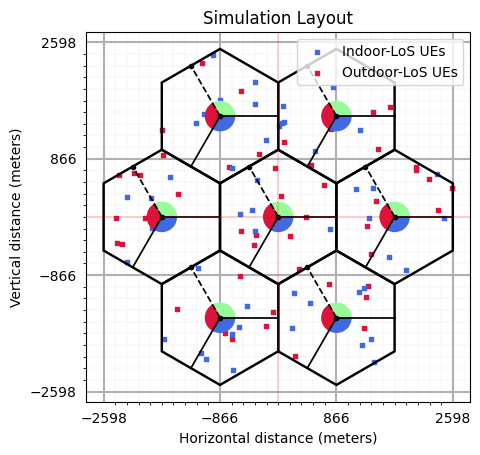

dBP (min, max): 3958.406982421875, 3958.406982421875


In [4]:
# Antenna Array at UE side
# assuming antenna element type to be "OMNI"
# with 2 panel and 2 single polarized antenna element per panel.
ueAntArray = AntennaArrays(antennaType = "OMNI",  centerFrequency = carrierFrequency, 
                           arrayStructure  = np.array([1,1,1,2,1]))
ueAntArray()

# # Radiation Pattern of Rx antenna element 
# ueAntArray.displayAntennaRadiationPattern()


# Antenna Array at BS side
# assuming antenna element type to be "3GPP_38.901", a parabolic antenna 
# with 4 panel and 4 single polarized antenna element per panel.
bsAntArray = AntennaArrays(antennaType = "3GPP_38.901", centerFrequency = carrierFrequency, 
                           arrayStructure  = np.array([1,1,2,16,1]))
bsAntArray()
    
# # Radiation Pattern of Tx antenna element 
# bsAntArray[0].displayAntennaRadiationPattern()

# Layout Parameters
isd                  = 1732        # inter site distance
minDist              = 35          # min distance between each UE and BS 
ueHt                 = 1.5         # UE height
bsHt                 = 35          # BS height
bslayoutType         = "Hexagonal" # BS layout type
ueDropType           = "Hexagonal" # UE drop type
htDist               = "equal"     # UE height distribution
ueDist               = "equal"     # UE Distribution per site
nSectorsPerSite      = 3           # number of sectors per site
maxNumFloors         = 1           # Max number of floors in an indoor object
minNumFloors         = 1           # Min number of floors in an indoor object
heightOfRoom         = 3           # height of room or ceiling in meters
indoorUEfract        = 0.5         # Fraction of UEs located indoor
lengthOfIndoorObject = 3           # length of indoor object typically having rectangular geometry 
widthOfIndoorObject  = 3           # width of indoor object
forceLOS             = True       # boolen flag if true forces every link to be in LOS state

# simulation layout object                                 
simLayoutObj = SimulationLayout(numOfBS = nBSs,
                                numOfUE = nUEs,
                                heightOfBS = bsHt,
                                heightOfUE = ueHt, 
                                ISD = isd,
                                layoutType = bslayoutType,
                                ueDropMethod = ueDropType, 
                                UEdistibution = ueDist,
                                UEheightDistribution = htDist,
                                numOfSectorsPerSite = nSectorsPerSite,
                                ueRoute = None)

simLayoutObj(terrain = propTerrain, 
             carrierFreq = carrierFrequency, 
             ueAntennaArray = ueAntArray,
             bsAntennaArray = bsAntArray,
             indoorUEfraction = indoorUEfract,
             lengthOfIndoorObject = lengthOfIndoorObject,
             widthOfIndoorObject = widthOfIndoorObject,
             forceLOS = forceLOS)

# displaying the topology of simulation layout
fig, ax = simLayoutObj.display2DTopology()

paramGen = simLayoutObj.getParameterGenerator()

# paramGen.displayClusters((0,0,0), rayIndex = 0)
channel = paramGen.getChannel()
Hf      = channel.ofdm(scs, Nfft)[0]

Nt        = bsAntArray.numAntennas # Number of BS Antennas
Nr        = ueAntArray.numAntennas


## Position Reference Signal

* Number of OFDM symbols occupied by PRS: `dl_PRS_NumSymbols`
* COMB size-N for PRS Transmission: `dl_PRS_CombSizeN`
* PRS symbol offset: `dl_PRS_ResourceSymbolOffset`
* Resource Element offset in PRS: `dl_PRS_ReOffset`
* PRS Resource-ID: `dl_PRS_SequenceID`
* Index of the Slot which will carry the PRS resource Grid: `slotNumber`
* Power scaling factor of PRS per ofdm symbol: `betaPRS`
* **PRS Resource Grid**: (prsGrid) - $\text{N}_\text{BS} \times 14*\text{numSlots} \times 12*\text{numRBs}$

In [5]:
dl_PRS_NumSymbols           = 12   # Number of OFDM symbols occupied by PRS
dl_PRS_CombSizeN            = 12   #12 # COMB size-N
dl_PRS_ResourceSymbolOffset = 0    # PRS symbol offset
dl_PRS_ReOffset             = 0    # RE offset in PRS    # not considered
dl_PRS_SequenceID           = 1031 # PRS Sequence ID.

# Number of slots per frame
numBSsPerSlot               = dl_PRS_CombSizeN
numSlots                    = int(np.ceil(nBSs/numBSsPerSlot))
slotNumber                  = 9    # Index of slot where the PRS is loaded
betaPRS                     = 1    # power scaling factor of PRS per ofdm symbol

prsGrid   = np.zeros((nBSs, 14, numRBs*12), dtype = np.complex64)
prsObject = np.empty((nBSs), dtype=object)
for nbs in range(nBSs):
    slotIndex      = int(nbs/numBSsPerSlot)
# Object for generating the PRS Resource Grid
    prsObject[nbs] = ResourceMapperPRS(betaPRS, dl_PRS_CombSizeN, dl_PRS_ReOffset + int(nbs%numBSsPerSlot),
                                       dl_PRS_ResourceSymbolOffset, dl_PRS_NumSymbols, dl_PRS_SequenceID+nbs)
    # Generate the PRS Resource Grid
    prsGrid[nbs]   = prsObject[nbs](slotNumber+slotIndex, numRBs)
    
prsGrid = prsGrid.reshape(nBSs, -1, numRBs*12)

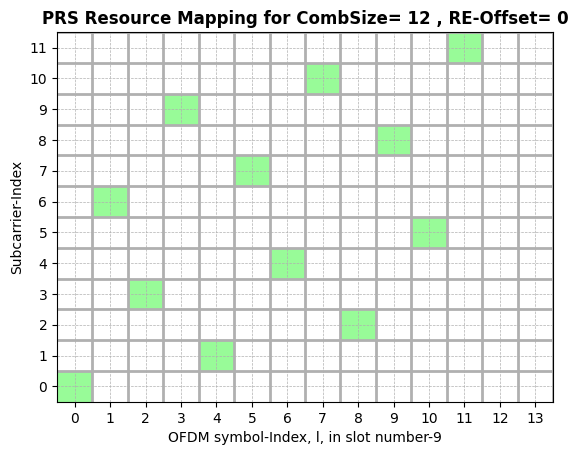

In [6]:
f,a = prsObject[0].displayResourceGrid() # Display PRS Resource Grid

## OFDM Transmitter: Create Transmission Grid

* Transmission Grid: `XGrid`
* Bandwidth RE Offset: `bwpOffset`

In [7]:
XGrid     = np.zeros((nBSs, 14, Nfft), dtype = np.complex64)
bwpOffset = np.random.randint(Nfft-numRBs*12)

## Load the resource grid to Transmission Grid
XGrid[...,bwpOffset:(bwpOffset+numRBs*12)] = prsGrid


print()
print("*****************************************************")
print("      Size of the Transmission Grid:  "+str(XGrid.shape))
print("         BWP Resoure Element Offset:  "+str(bwpOffset))
print("      Size of the PRS-Resource Grid:  "+str(prsGrid.shape))
print("*****************************************************")
print()


*****************************************************
      Size of the Transmission Grid:  (21, 14, 1024)
         BWP Resoure Element Offset:  2
      Size of the PRS-Resource Grid:  (21, 14, 1020)
*****************************************************



## Compute the Measurement Windows

In [8]:

## Compute Measurement Window
nBeamsPhi      = 64
nBeamsTheta    = 1
numBeams       = nBeamsPhi*nBeamsTheta
Pt_dBm         = 53
Pt             = 10**(0.1*(Pt_dBm-30))
lamda          = 3*10**8/carrierFrequency
Nty            = bsAntArray.arrayStructure[2]
Ntx            = bsAntArray.arrayStructure[3]
phiMean        = paramGen.phiAoD_LoS[0]*np.pi/180
phiStd         = 2*np.ones((nBSs, nUEs))*np.pi/180
thetaMean      = paramGen.thetaAoD_LoS[0]*np.pi/180
thetaStd       = 2*np.ones((nBSs, nUEs))*np.pi/180
azimuthGrid    = np.linspace(phiMean  -0.5*phiStd,   phiMean  +0.5*phiStd,     nBeamsPhi)
elevationGrid  = np.linspace(thetaMean-0.5*thetaStd, thetaMean+0.5*thetaStd, nBeamsTheta)


### Transmit Beamforming

1. Transmit Power, $P_t$ (dBm)
2. Inter-Antenna spacing, d (m)
3. Beamformed Grid, Xf
4. Beamforming Direction: (0,0)

### Add Noise

- Noise Variance: $k_B$ * T * B where
    * $k_B$: Boltzmann Constant: $1.380649 \times 10^{-23}$
    * T: Temperature: 300 K
    * B: Bandwidth: 30 MHz
- Carrier Frequency Offset: **Not considered in this simulation**
    * kppm (CFO in ppm of carrier frequency): 0 
    * CFO 
    
- Received Grid with Noise (Yf)

### Pass the Beamformed Grid Through Wireless Channel

1. OFDM Channel, Hf:  (Number of Symbols (1), Number of BSs, Number of UEs, Nfft, Number of Rx Antennas, Number Tx Antennas)
2. Transmit Grid, Xf: (Number of BSs, Number of Tx Antennas, Number of Symbols, Nfft)
3. Received Grid, Y:  (Number of UEs, Number of Rx Antennas, Number of Symbols, Nfft)

``Note:`` Static Wireless Channel (No mobility is considered)

In [9]:

phi          = azimuthGrid[np.newaxis,:].repeat(nBeamsTheta, 0).reshape(-1, nBSs, nUEs).transpose(1,2,0)
theta        = np.tile(elevationGrid[:,np.newaxis], [1, nBeamsPhi, 1, 1]).reshape(-1, nBSs, nUEs).transpose(1,2,0)
rsrp         = np.zeros((nBSs, nUEs, numBeams), dtype=np.float64)
antLocations = (bsAntArray.locations[0,0,:,:,0])[np.newaxis,np.newaxis,...,:,np.newaxis]
for nue in range(nUEs):
    ## Transmit Beamforming
    #################################################################
    # Bemforming angles
    # Inter-element spacing in vertical and horizontal
    steeringVector = np.stack((np.sin(theta[:,nue], dtype = np.float32)*np.cos(phi[:,nue], dtype = np.float32),
                               np.sin(theta[:,nue], dtype = np.float32)*np.sin(phi[:,nue], dtype = np.float32),
                               np.cos(theta[:,nue], dtype = np.float32)), axis = -1)[...,np.newaxis,np.newaxis,np.newaxis,:]
    
    beamVectors    = (steeringVector@antLocations)[...,0,0].reshape(nBSs,numBeams,-1)/lamda
    beamVectors    = np.sqrt(Pt*dl_PRS_CombSizeN/Nt)*np.exp(-1j*2*np.pi*beamVectors)

    Xf             = np.complex64(XGrid[:,np.newaxis,...,np.newaxis]*beamVectors[...,np.newaxis,np.newaxis,:])
    print(" UE-index: "+str(nue)+" | Beamforming completed!")
    
    ## Pass through the wireless Channel
    Y = np.complex64((Hf[0,:,nue,np.newaxis,np.newaxis]@Xf[...,np.newaxis])[...,0])
    
    # Add Noise
    BoltzmanConst = 1.380649*(10**(-23))
    temperature   = 300
    noisePower    = BoltzmanConst*temperature*Bandwidth
    kppm          = 0
    fCFO          = kppm*(np.random.rand()-0.5)*carrierFrequency*(10**(-6)); # fCFO = CFO*subcarrierSpacing
    CFO           = (fCFO/scs)/Nfft

    Yf            = np.complex64(AddNoise(False)(Y, noisePower, 0))    #Added

    # Extracting the Resource Grid
    rxGrid        = Yf[...,bwpOffset:(bwpOffset+numRBs*12),:].transpose(0,1,4,2,3)

    # Compute the RSRP of each beam
    for lbs in range(nBSs):
    #         print("lbs, lue",lbs, lue)
        rsrp[lbs, nue] = (np.abs(rxGrid[lbs].transpose(2,3,1,0)[prsObject[lbs].prsIndices])**2).sum(0).sum(0)
        
    print(" UE-index: "+str(nue)+" | RSRP measured!")


 UE-index: 0 | Beamforming completed!
 UE-index: 0 | RSRP measured!
 UE-index: 1 | Beamforming completed!
 UE-index: 1 | RSRP measured!
 UE-index: 2 | Beamforming completed!
 UE-index: 2 | RSRP measured!
 UE-index: 3 | Beamforming completed!
 UE-index: 3 | RSRP measured!
 UE-index: 4 | Beamforming completed!
 UE-index: 4 | RSRP measured!
 UE-index: 5 | Beamforming completed!
 UE-index: 5 | RSRP measured!
 UE-index: 6 | Beamforming completed!
 UE-index: 6 | RSRP measured!
 UE-index: 7 | Beamforming completed!
 UE-index: 7 | RSRP measured!
 UE-index: 8 | Beamforming completed!
 UE-index: 8 | RSRP measured!
 UE-index: 9 | Beamforming completed!
 UE-index: 9 | RSRP measured!
 UE-index: 10 | Beamforming completed!
 UE-index: 10 | RSRP measured!
 UE-index: 11 | Beamforming completed!
 UE-index: 11 | RSRP measured!
 UE-index: 12 | Beamforming completed!
 UE-index: 12 | RSRP measured!
 UE-index: 13 | Beamforming completed!
 UE-index: 13 | RSRP measured!
 UE-index: 14 | Beamforming completed!
 

## RSRP vs beam Index

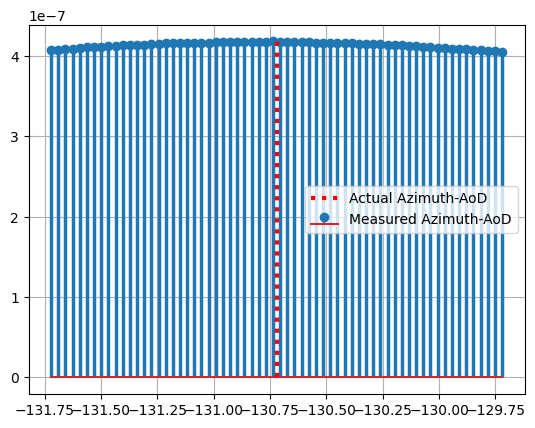

In [10]:
ueIndex = 0
bsIndex = 0

fig, ax = plt.subplots()
# markerline, stemlines, baseline = ax.stem(azimuthGridNew, rsrpNew, 'g', label = "Interpolated Azimuth-AoD")
# stemlines.set_linewidth(1)
# markerline.set_markersize(2)
# stemlines.set_linestyles(":")
markerline, stemlines, baseline = ax.stem(azimuthGrid[:,bsIndex,ueIndex]*180/np.pi, rsrp[bsIndex,ueIndex].reshape(nBeamsTheta, nBeamsPhi).sum(0), label = "Measured Azimuth-AoD")
stemlines.set_linewidth(2.5)
markerline.set_markersize(6)
ax.vlines(paramGen.phiAoD_LoS[0,bsIndex,ueIndex], ymin = 0, ymax = rsrp[bsIndex,ueIndex].reshape(nBeamsTheta, nBeamsPhi).sum(0).max(), color = "r", lw = 3, ls = ":", label = "Actual Azimuth-AoD")

ax.legend(loc = 'best')
ax.grid()
plt.show()

### AoD Estimation

In [11]:
xoAEst = np.zeros((nBSs, nUEs, 2))
xoA    = np.stack((paramGen.phiAoD_LoS[0], paramGen.thetaAoD_LoS[0]), axis = -1)*np.pi/180
beamIndices = rsrp.argmax(-1)
for nbs in range(nBSs):
    for nue in range(nUEs):
        xoAEst[nbs,nue, 0] = phi[nbs,nue, beamIndices[nbs,nue]]
        xoAEst[nbs,nue, 1] = theta[nbs,nue, beamIndices[nbs,nue]]

## Position Estimation + K-Best Measurement Selection (Genie Aided)

#### Measurement Selection:

- Select the most accurate k ToA measnurements for Positioning
- Even 1 Inaccuracte measurement can compromise the positioning performance.
- **Genie Aided Measurement Selection**: Assumes that the accuracy of the each measurment is known somehow.
    * Selects the best ToA-measurements available to each UE from the BSs for estimating the location.
    

In [12]:
rxPosition  = simLayoutObj.UELocations
txPosition  = simLayoutObj.BSLocations
k           = 4  # Select k-best measurements
error       = np.abs(xoAEst[...,0] - xoA[...,0]) # Compute the ToA error in each measurement

# Position Estimation Object: 
    # Positioning based on: DoA
    # Optimization Method: Gradient Descent
posEstimator = LeastSquareDoA()


rxPositionEstimate = np.zeros((nUEs, 3))
std                = np.zeros((nUEs, 2))
kBestIndices       = np.zeros((nUEs, k), dtype = np.int8)

for nue in range(nUEs):
    bsIndices    = np.argmin(error[..., nue].reshape(-1, 3), axis = -1)
    siteIndices  = np.argsort(np.min(error[..., nue].reshape(-1, 3), -1))[0:k]
    kBestIndices[nue] = siteIndices*nSectorsPerSite + bsIndices[siteIndices]
    rxPositionEstimate[nue], std[nue] = posEstimator(txPosition[kBestIndices[nue]], xoAEst[kBestIndices[nue],nue])
    print("nue: "+str(nue)+" | Rx Location Estimate: "+str(rxPositionEstimate[nue]))

nue: 0 | Rx Location Estimate: [-359.01876144 -417.47088924   29.41016588]
nue: 1 | Rx Location Estimate: [ 42.78669819 174.58115965  30.51680364]
nue: 2 | Rx Location Estimate: [ 779.10774189 -174.81345912   28.66695834]
nue: 3 | Rx Location Estimate: [ 182.05063066 -279.76018999   24.4014134 ]
nue: 4 | Rx Location Estimate: [-43.97485771 725.42467735  28.03582379]
nue: 5 | Rx Location Estimate: [418.68949763   4.63860667  29.95735549]
nue: 6 | Rx Location Estimate: [-347.31445659 -203.84958682   33.62075529]
nue: 7 | Rx Location Estimate: [-395.13081408  106.3275688    26.66068703]
nue: 8 | Rx Location Estimate: [ 305.60487736 -776.44800372   27.75456728]
nue: 9 | Rx Location Estimate: [-576.9003876    49.71920292   28.06830207]
nue: 10 | Rx Location Estimate: [-334.75067944 -262.58239455   30.19317779]
nue: 11 | Rx Location Estimate: [ 46.18868112 312.28143355  30.66991935]
nue: 12 | Rx Location Estimate: [679.37966381 481.38075781  29.23397206]
nue: 13 | Rx Location Estimate: [-318

### Visualization of Positioning
- Show the accurcy of positioning by comparing the actual location against the true location.

``Note``: Please use the intractive matplotlib **%matplotlib widget** to see this graph.

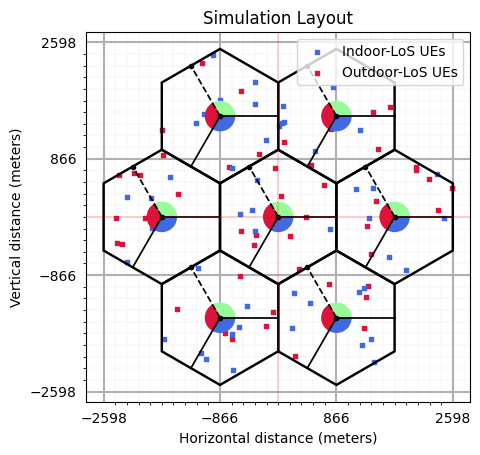

In [13]:
## PSS Detection Plot
#################################################################
rxPosition  = simLayoutObj.UELocations
txPosition  = simLayoutObj.BSLocations
# rangeEst_2D = np.sqrt(np.abs((ToAe*(3*10**8))**2 - (rxPosition[:,2].reshape(1,-1)-txPosition[:,2].reshape(-1,1))**2))

# fig, ax = plt.subplots()
fig, ax = simLayoutObj.display2DTopology(isEqualAspectRatio = True)
colors  = ["k","m","r","b","g","y","crimson"]

linestyle_tuple = ['solid', 'dotted', 'dashed', 'dashdot', 
                   (0, (5, 10)),                # 'loosely dashed'
                   (0, (1, 10)),                # 'loosely dotted'
                   (5, (10, 3)),                # 'long dash with offset'
                   (0, (5, 1)),                 # 'densely dashed'
                   (0, (3, 10, 1, 10)),         # 'loosely dashdotted'
                   (0, (3, 5, 1, 5)),           # 'dashdotted'
                   (0, (3, 1, 1, 1)),           # 'densely dashdotted'
                   (0, (3, 5, 1, 5, 1, 5)),     # 'dashdotdotted'
                   (0, (3, 10, 1, 10, 1, 10)),  # 'loosely dashdotdotted'
                   (0, (3, 1, 1, 1, 1, 1))]     # 'densely dashdotdotted'

# for nbs in range(k):
#     for nue in range(nUEs):
#             circle1 = plt.Circle((txPosition[kBestIndices[nue, nbs], 0], txPosition[kBestIndices[nue, nbs], 1]), rangeEst_2D[kBestIndices[nue, nbs], nue], 
#                                  color = colors[nue%7], lw = 0.35, ls = linestyle_tuple[nue%7], fill = False, zorder = 0)
#             ax.add_artist(circle1)

ax.scatter(txPosition[:,0], txPosition[:,1], marker="P", color="b", edgecolors='white', 
           s = 125, label="Tx-Locations", zorder = 3)
ax.scatter(rxPositionEstimate[:,0], rxPositionEstimate[:,1], marker="o", color="g", 
           s = 75, label="Estimated Rx-Locations", zorder = 1)
ax.scatter(rxPosition[:,0], rxPosition[:,1], marker=".", color="r", edgecolors='white', 
           s = 100, label="True Rx-Locations", zorder = 2)
ax.legend()
ax.set_title("Transmitter's Locations and Estimation Accuracy (True UE Location vs Estimated UE Locations)")
# ax.set_xlim([-200, 200])
# ax.set_ylim([-200, 200])
ax.grid(True)

## Performance Analysis of Positioning Error for ToA based method
The perfrormance of the positioning methods is analyzed using:

1. 50 percentile Position Error in Horizontal and Vertical Direction.
2. 67 percentile Position Error in Horizontal and Vertical Direction.
3. 90 percentile Position Error in Horizontal and Vertical Direction.
4. Fraction of users which are positioned with accuracy better ththan 50 cm.


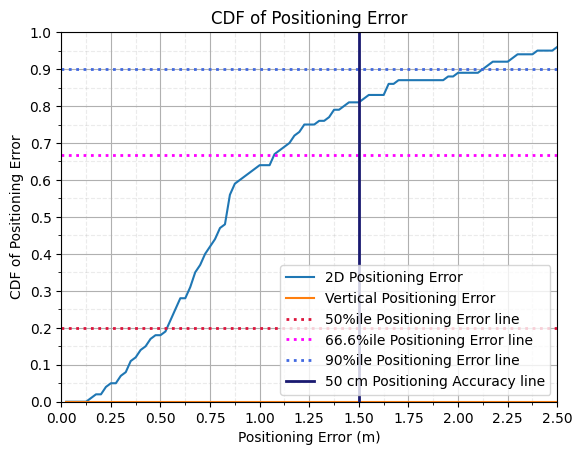

In [14]:
nbins  = nUEs
xlimit = 2.5
ylimit = 1
posError3D = np.linalg.norm(rxPositionEstimate-rxPosition[:], axis=1)
posError3D = np.where(np.isnan(posError3D), 0, posError3D)
posError2D = np.linalg.norm(rxPositionEstimate[:, 0:2]-rxPosition[:, 0:2], axis=1)

# Horizontal Error
count, bins_count = np.histogram(posError2D, bins = nbins, range = [0, xlimit])
pdf = count/nUEs
cdf = np.cumsum(pdf)

fig, ax = plt.subplots()
ax.plot(bins_count[1:], cdf, label = "2D Positioning Error")

# Vertical Error
count, bins_count = np.histogram(posError3D, bins = nbins, range = [0, xlimit])
pdf = count/nUEs
cdf = np.cumsum(pdf)
ax.plot(bins_count[1:], cdf, label = "Vertical Positioning Error")

ax.set_xticks(np.linspace(0, xlimit, 11))
ax.set_xticks(np.linspace(0, xlimit, 21), minor=True)
ax.set_yticks(np.linspace(0, ylimit, 11))
ax.set_yticks(np.linspace(0, ylimit, 21), minor=True)
ax.set_xlabel("Positioning Error (m)")
ax.set_ylabel("CDF of Positioning Error")
ax.set_title("CDF of Positioning Error")
ax.axhline(y = 0.2, lw = 2, alpha = 1, linestyle = ':', color = "crimson", label = "50%ile Positioning Error line")
ax.axhline(y = 2/3, lw = 2, alpha = 1, linestyle = ':', color = "magenta", label = "66.6%ile Positioning Error line")
ax.axhline(y = 0.9, lw = 2, alpha = 1, linestyle = ':', color = "royalblue", label = "90%ile Positioning Error line")
ax.axvline(x = 1.5,   lw = 2, alpha = 1, linestyle = '-', color = "midnightblue", label = "50 cm Positioning Accuracy line")

# Specify different settings for major and minor grids
ax.grid(which = 'minor', alpha = 0.25, linestyle = '--')
ax.grid(which = 'major', alpha = 1)

ax.set_xlim([0,xlimit])
ax.set_ylim([0,ylimit])
ax.legend()
plt.show()

# # Code to save the Database
# idx  = 0
# flag = True
# while(flag):
#     print("flag: "+str(idx)+" | i="+str(idx))
#     filename = "Databases/DLAoD-"+str([idx])+".npz"
#     if(os.path.exists(filename)):
#         idx  = idx + 1
#     else:
#         np.savez(filename, posError3D = posError3D, posError2D = posError2D, 
#                  rxPositionEstimate = rxPositionEstimate, rxPosition = rxPosition, 
#                  xoA = xoA, xoAEst = xoAEst, txPosition = txPosition, scs = scs,
#                  carrierFrequency = carrierFrequency,  Nfft = Nfft, nBSs = nBSs, 
#                  nUEs = nUEs, numRBs = numRBs, propTerrain = propTerrain, 
#                  bsArrayStructure  = bsAntArray.arrayStructure, 
#                  ueArrayStructure  = ueAntArray.arrayStructure)
#         flag = False

## Performance Analysis for DL-AoD method: 2000 UEs

/tmp/ipykernel_56393/3860440226.py:29: RuntimeWarning: invalid value encountered in divide
  pdf = count/count.sum()


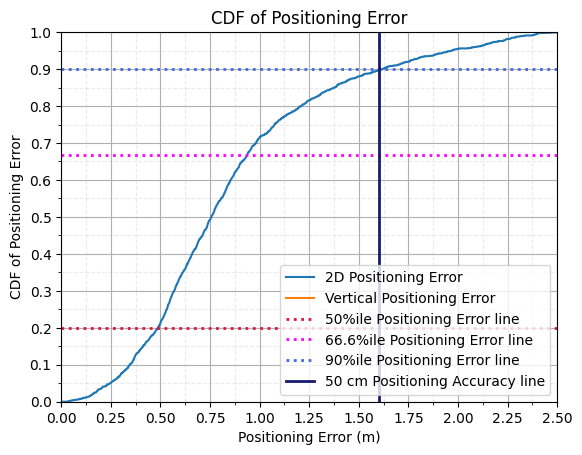

In [17]:
filename = "Databases/DLAoD-"+str([0])+".npz"
ds       = np.load(filename)

posError3D = ds["posError3D"]
posError2D = ds["posError2D"]

for i in range(1,idx+1):
    
    filename = "Databases/DLAoD-"+str([i])+".npz"
    ds         = np.load(filename)
    
    posError3D = np.concatenate([posError3D, ds["posError3D"]])
    posError2D = np.concatenate([posError2D, ds["posError2D"]])

nbins = int(posError2D.size)
xlimit = 2.5
ylimit = 1

# Horizontal Error
count, bins_count = np.histogram(posError2D, bins = nbins, range = [0, xlimit])
pdf = count/count.sum()
cdf = np.cumsum(pdf)

fig, ax = plt.subplots()
ax.plot(bins_count[1:], cdf, label = "2D Positioning Error")

# Vertical Error
count, bins_count = np.histogram(posError3D, bins = nbins, range = [0, xlimit])
pdf = count/count.sum()
cdf = np.cumsum(pdf)
ax.plot(bins_count[1:], cdf, label = "Vertical Positioning Error")

ax.set_xticks(np.linspace(0, xlimit, 11))
ax.set_xticks(np.linspace(0, xlimit, 21), minor=True)
ax.set_yticks(np.linspace(0, ylimit, 11))
ax.set_yticks(np.linspace(0, ylimit, 21), minor=True)
ax.set_xlabel("Positioning Error (m)")
ax.set_ylabel("CDF of Positioning Error")
ax.set_title("CDF of Positioning Error")
ax.axhline(y = 0.2, lw = 2, alpha = 1, linestyle = ':', color = "crimson", label = "50%ile Positioning Error line")
ax.axhline(y = 2/3, lw = 2, alpha = 1, linestyle = ':', color = "magenta", label = "66.6%ile Positioning Error line")
ax.axhline(y = 0.9, lw = 2, alpha = 1, linestyle = ':', color = "royalblue", label = "90%ile Positioning Error line")
ax.axvline(x = 1.6,lw = 2, alpha = 1, linestyle = '-', color = "midnightblue", label = "50 cm Positioning Accuracy line")

# Specify different settings for major and minor grids
ax.grid(which = 'minor', alpha = 0.25, linestyle = '--')
ax.grid(which = 'major', alpha = 1)

ax.set_xlim([0,xlimit])
ax.set_ylim([0,ylimit])
ax.legend()
plt.show()

## Further Study
The tutorial can be extended further to study the effect of:

- Subcarrier Spacing ($\Delta f$)
- Carrier Frequency ($f_c$)
- Bandwidth ($B$)
- NLoS Probability ($p_{LOS}$)
- Transmitter Power ($P_t$)
- Number of Base-stations ($N_{BS}$)
- Comb-factor ($K_{comb}$)

on positioning accuracy. Furthermore, different terrians have different propagation characteristics. These characteristics effect the accuracy of positioning.

``Thanks for reading the tutorial!``